### Notebook for the label transfer of WT mice FB to rest of FB genotypes with `scANVI`

- **Developed by:** Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology - Faculty of Medicine - Julius-Maximilian-Universität Würzburg**
- v240311

### Import required modules

In [1]:
import scvi
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import plotnine as p
from pywaffle import Waffle
import matplotlib.pyplot as plt
from scib_metrics.benchmark import Benchmarker

### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                 10.2.0
absl                NA
asttokens           NA
attr                23.2.0
chex                0.1.85
comm                0.2.1
contextlib2         NA
cycler              0.12.1
cython_runtime      NA
dateutil            2.8.2
debugpy             1.8.1
decorator           5.1.1
docrep              0.3.2
etils               1.7.0
executing           2.0.1
flax                0.8.1
fsspec              2024.2.0
h5py                3.10.0
igraph              0.11.4
importlib_resources NA
ipykernel           6.29.2
ipywidgets          8.1.2
jax                 0.4.19
jaxlib              0.4.19
jedi                0.19.1
joblib              1.3.2
kiwisolver          1.4.5
lightning           2.1.4
lightning_utilities 0.10.1
llvmlite            0.42.0
matplotlib          3.8.3
mizani              0.11.0
ml_collections      NA
ml_dtypes           0.3.2
mpl_toolkits        NA
msgpack             1.0.7
mudata        

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

### Read in data

In [5]:
heart_scANVI = sc.read_h5ad('../../../data/Kdm6aKO_ALL_GEX-CB_scANVI-FB_ctl240311.raw.h5ad')
heart_scANVI

AnnData object with n_obs × n_vars = 8768 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [6]:
heart_scANVI.obs_names = [name.rsplit('-', 2)[0] for name in heart_scANVI.obs_names]
heart_scANVI.obs_names

Index(['AAACCAACAAACGGGC-1-KDM6A_wt_11', 'AAACCAACAATTGCGC-1-KDM6A_wt_11',
       'AAACCAACATAGACTT-1-KDM6A_wt_11', 'AAACCGAAGCACTAGT-1-KDM6A_wt_11',
       'AAACCGAAGCGTGCGT-1-KDM6A_wt_11', 'AAACCGGCAAGGTCGA-1-KDM6A_wt_11',
       'AAACGCGCACCACAAC-1-KDM6A_wt_11', 'AAACGGATCAGCCAAT-1-KDM6A_wt_11',
       'AAACGGATCTAAGTCA-1-KDM6A_wt_11', 'AAACGTACAGCAACAG-1-KDM6A_wt_11',
       ...
       'TTGTGAGGTAGTTGGC-1-GSKJ4_treat_52',
       'TTGTGAGGTCATGCAA-1-GSKJ4_treat_52',
       'TTGTGCCTCTAATCTC-1-GSKJ4_treat_52',
       'TTGTTGCGTCAAGACC-1-GSKJ4_treat_52',
       'TTGTTGCGTTACAAAC-1-GSKJ4_treat_52',
       'TTTAAGGTCATGCCTC-1-GSKJ4_treat_52',
       'TTTAGCAAGGTCCGTA-1-GSKJ4_treat_52',
       'TTTCGTCCACCTGTAA-1-GSKJ4_treat_52',
       'TTTCTCACATAATGTC-1-GSKJ4_treat_52',
       'TTTGTGAAGAAAGGAA-1-GSKJ4_treat_52'],
      dtype='object', length=8768)

In [7]:
heart_scANVI.obs['seed_labels'] = heart_scANVI.obs['C_scANVI'].copy()
del(heart_scANVI.obs['C_scANVI'])
heart_scANVI

AnnData object with n_obs × n_vars = 8768 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

### Visualise cell type distribution per condition

In [8]:
heart_scANVI.obs['seed_labels'].value_counts()

seed_labels
FB1    3228
FB2    1834
FB4    1236
FB3    1128
FB6     690
FB5     652
Name: count, dtype: int64

In [9]:
pd.crosstab(heart_scANVI.obs['seed_labels'], heart_scANVI.obs['genotype'])

genotype,KO,Sham,Tx,WT
seed_labels,,,,
FB1,1410,512,269,1037
FB2,747,184,201,702
FB3,222,546,155,205
FB4,349,360,264,263
FB5,197,99,77,279
FB6,217,142,62,269


### Read in other unannotated dataset and split into groups

In [10]:
heart_scANVI.obs['genotype'].value_counts()

genotype
KO      3142
WT      2755
Sham    1843
Tx      1028
Name: count, dtype: int64

In [11]:
reference = heart_scANVI[heart_scANVI.obs['genotype'].isin(['WT', 'Sham'])]
reference

View of AnnData object with n_obs × n_vars = 4598 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [12]:
query = heart_scANVI[~heart_scANVI.obs['genotype'].isin(['WT', 'Sham'])]
query.obs['seed_labels'] = 'Unknown'
query

AnnData object with n_obs × n_vars = 4170 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [13]:
adata = reference.concatenate(query, batch_key = 'batch', batch_categories = ['reference', 'query'], join = 'inner')
adata

AnnData object with n_obs × n_vars = 8768 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

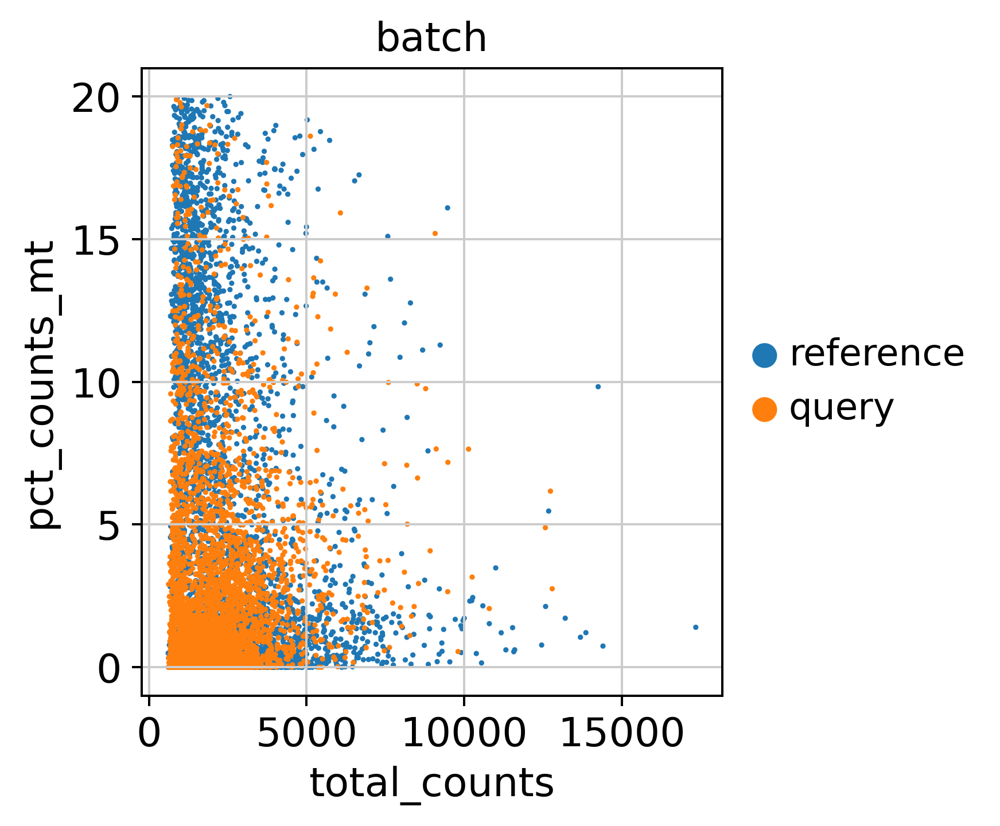

In [14]:
sc.pl.scatter(adata, x = 'total_counts', y = 'pct_counts_mt', color = "batch", frameon = False)

In [15]:
adata.obs['genotype'].value_counts()

genotype
KO      3142
WT      2755
Sham    1843
Tx      1028
Name: count, dtype: int64

In [16]:
adata.obs['sample'].value_counts()

sample
KDM6A_KO_31       1982
KDM6A_wt_11       1724
KDM6A_KO_34       1160
GSKJ4_sham_51     1125
KDM6A_wt_40       1031
GSKJ4_sham_57      718
GSKJ4_treat_47     536
GSKJ4_treat_52     492
Name: count, dtype: int64

### Select HVGs

In [17]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "sample",
    subset = True,
    span = 1
)
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 8768 × 7000
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'batch_colors', 'hvg'
    layers: 'counts'

### Transfer of annotation with scANVI

In [18]:
scvi.model.SCVI.setup_anndata(adata,
                              batch_key = "sample", 
                            categorical_covariate_keys = ["sample"], 
                            labels_key = "seed_labels", 
                            layer = 'counts')

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [19]:
scvi_model = scvi.model.SCVI(adata, 
                             n_latent = 50, 
                             n_layers = 3, 
                             dispersion = 'gene-batch', 
                             gene_likelihood = 'nb')

In [20]:
scvi_model.train(75, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = 'gpu',
                 devices= [0])

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 75/75: 100%|██████████| 75/75 [00:27<00:00,  2.81it/s, v_num=1, train_loss_step=2.03e+3, train_loss_epoch=1.96e+3]

`Trainer.fit` stopped: `max_epochs=75` reached.


Epoch 75/75: 100%|██████████| 75/75 [00:27<00:00,  2.76it/s, v_num=1, train_loss_step=2.03e+3, train_loss_epoch=1.96e+3]


In [21]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)

### Evaluate model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

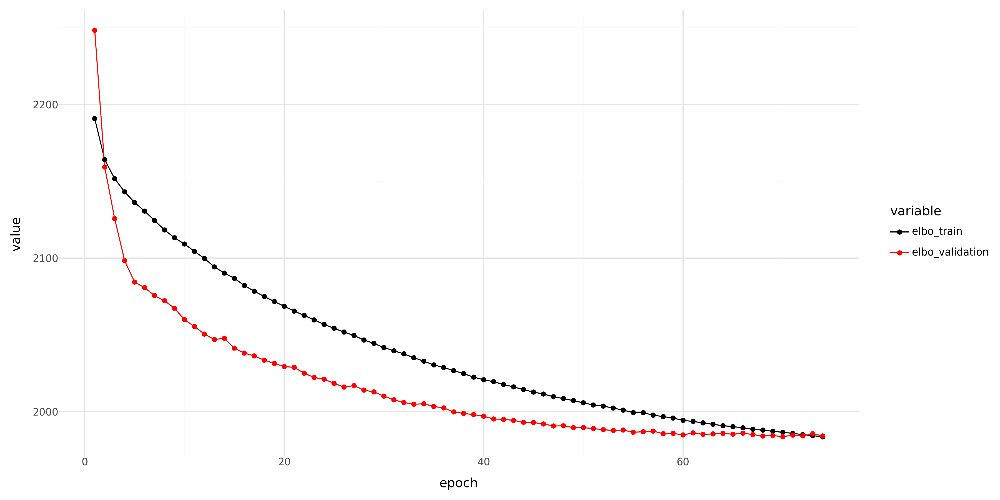

In [22]:
history_df = (
    scvi_model.history['elbo_train'].astype(float)
    .join(scvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

### Label transfer with `scANVI` 

In [23]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [24]:
scanvi_model.train(75, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = 'gpu',
                 devices= [0])

INFO     Training for 75 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 75/75: 100%|██████████| 75/75 [01:12<00:00,  1.08s/it, v_num=1, train_loss_step=1.9e+3, train_loss_epoch=1.93e+3] 

`Trainer.fit` stopped: `max_epochs=75` reached.


Epoch 75/75: 100%|██████████| 75/75 [01:12<00:00,  1.03it/s, v_num=1, train_loss_step=1.9e+3, train_loss_epoch=1.93e+3]


In [25]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [26]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

### Explore model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

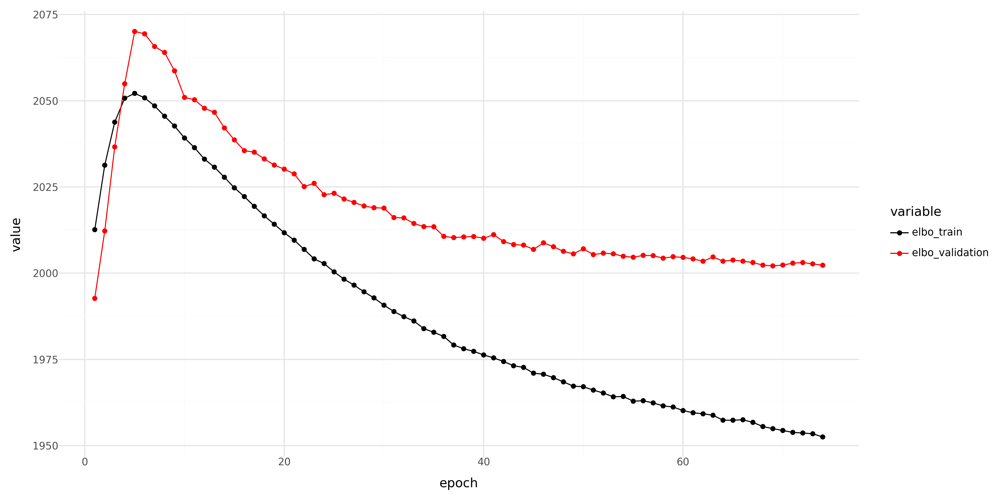

In [27]:
history_df = (
    scanvi_model.history['elbo_train'].astype(float)
    .join(scanvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

### Visualise corrected dataset

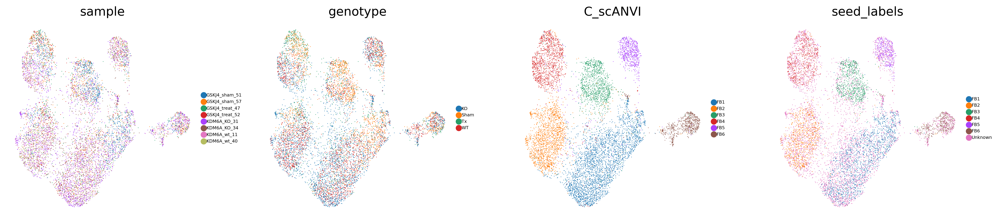

In [32]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.3, spread = 4, random_state = 1712)
sc.pl.umap(adata, frameon = False, color = ['sample', 'genotype', 'C_scANVI', 'seed_labels'], size = 2, legend_fontsize = 5, ncols = 4)

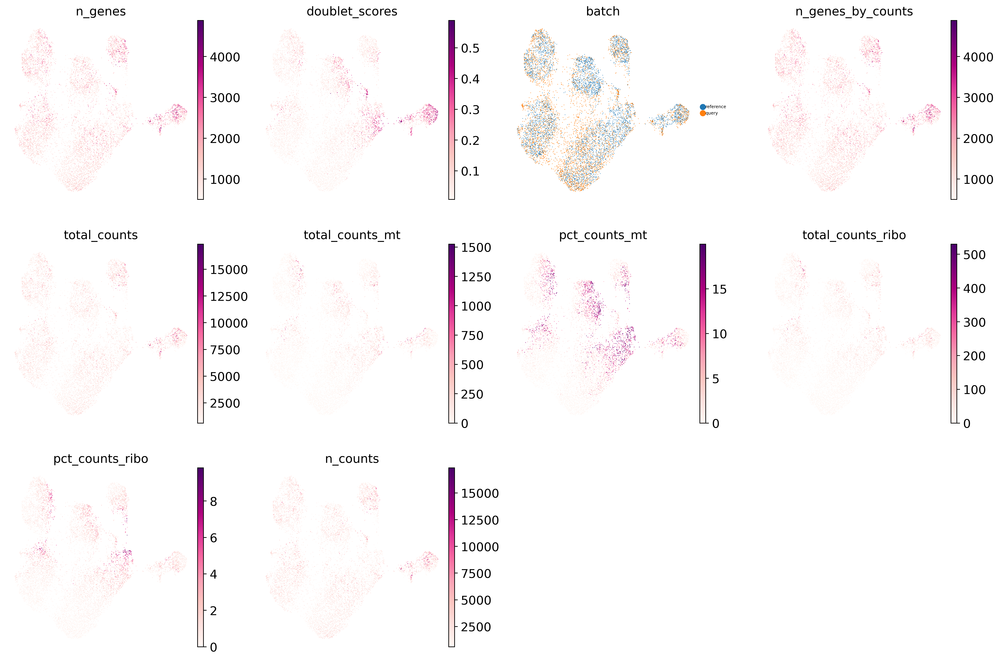

In [33]:
sc.pl.umap(adata, frameon = False, color = ['n_genes', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts'], size = 2, legend_fontsize = 5, ncols = 4, cmap = 'RdPu')

### Evaluate integration with `scIB-metrics`

In [31]:
adata.X = adata.X.astype(float)
adata.obsm['X_scVI'] = adata.obsm['X_scVI'].astype(float)
adata.obsm['X_scANVI'] = adata.obsm['X_scANVI'].astype(float)

In [34]:
bm = Benchmarker(
    adata,
    batch_key="sample",
    label_key="C_scANVI",
    embedding_obsm_keys=["X_pca", "X_scVI", "X_scANVI"],
    n_jobs = -1,
)
bm.benchmark()

computing PCA
    with n_comps=50
    finished (0:00:01)


Embeddings: 100%|██████████| 3/3 [00:39<00:00, 13.21s/it]


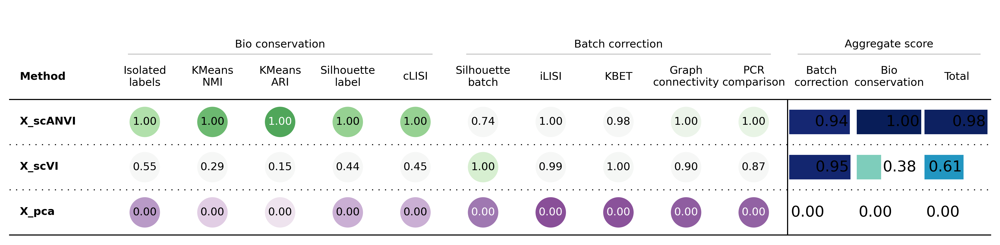

In [35]:
bm.plot_results_table()

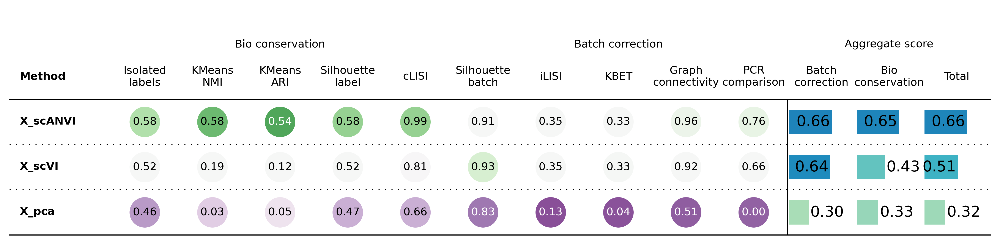

In [36]:
bm.plot_results_table(min_max_scale = False)

### Modify object to plot canonical marker genes

In [37]:
adata_toplot = anndata.AnnData(X = np.sqrt(sc.pp.normalize_total(adata_raw, inplace = False)["X"]), var = adata_raw.var, obs = adata.obs, obsm = adata.obsm)
adata_toplot

normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 8768 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: '_scvi_extra_categorical_covs', 'X_scVI', 'X_scANVI', 'X_umap', 'X_pca'

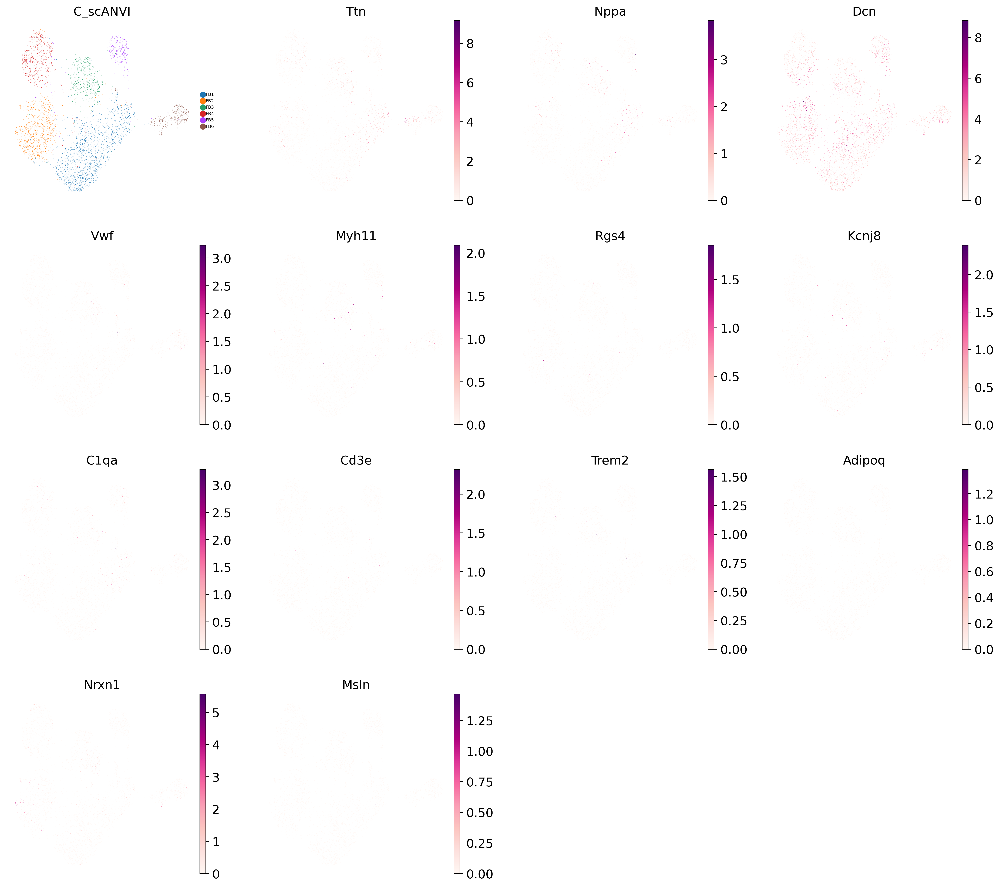

In [38]:
sc.pl.umap(adata_toplot, frameon = False, color = ['C_scANVI', 'Ttn', 'Nppa', 'Dcn', 'Vwf', 'Myh11', 'Rgs4', 'Kcnj8', 'C1qa', 'Cd3e', 'Trem2', 'Adipoq', 'Nrxn1', 'Msln'], size = 0.6, legend_fontsize = 5, ncols = 4, cmap = 'RdPu')

### Visualise proportions

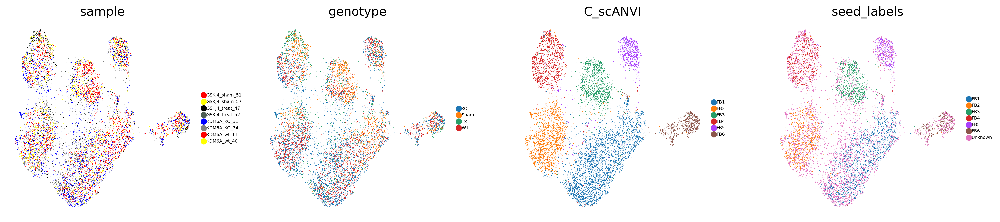

In [42]:
sc.pl.umap(adata, frameon = False, color = ['sample', 'genotype', 'C_scANVI', 'seed_labels'], size = 2.5, legend_fontsize = 5, ncols = 4)

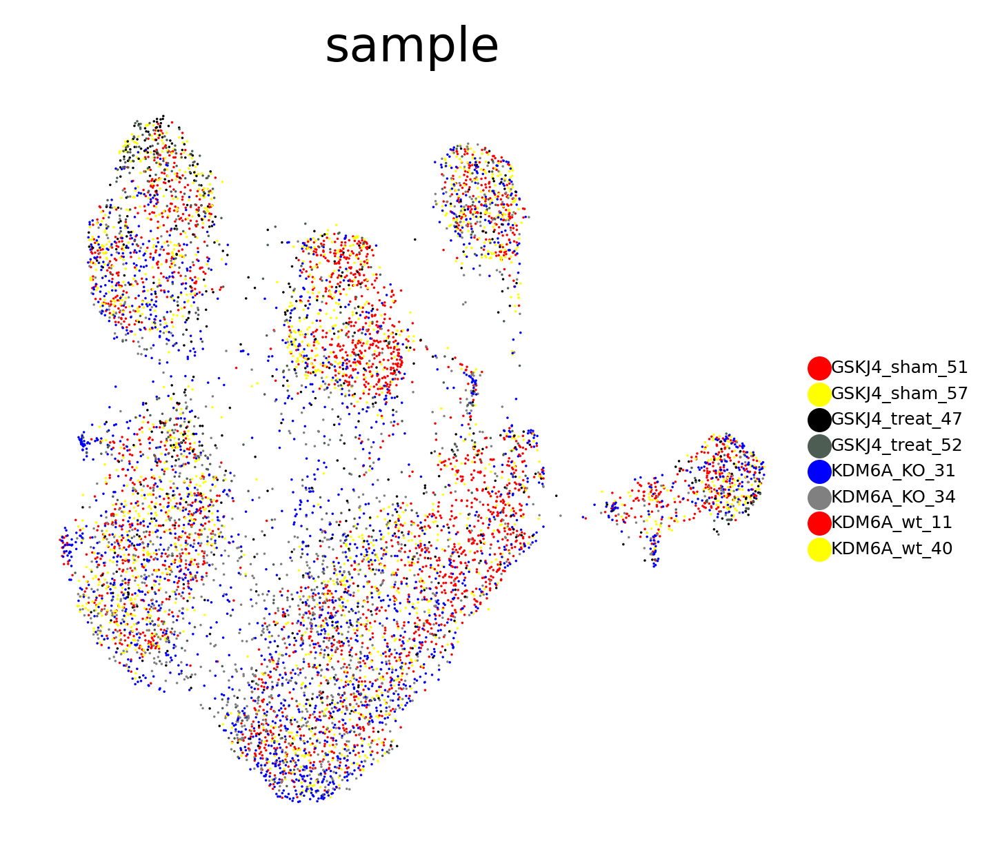

In [41]:
bauhaus_colors = ['#FF0000', '#FFFF00', '#000000', '#4D5D53', '#0000FF', '#808080']
sc.pl.umap(adata, frameon = False, color = ['sample'], size = 2.0, legend_fontsize = 5, ncols = 4, palette = bauhaus_colors)

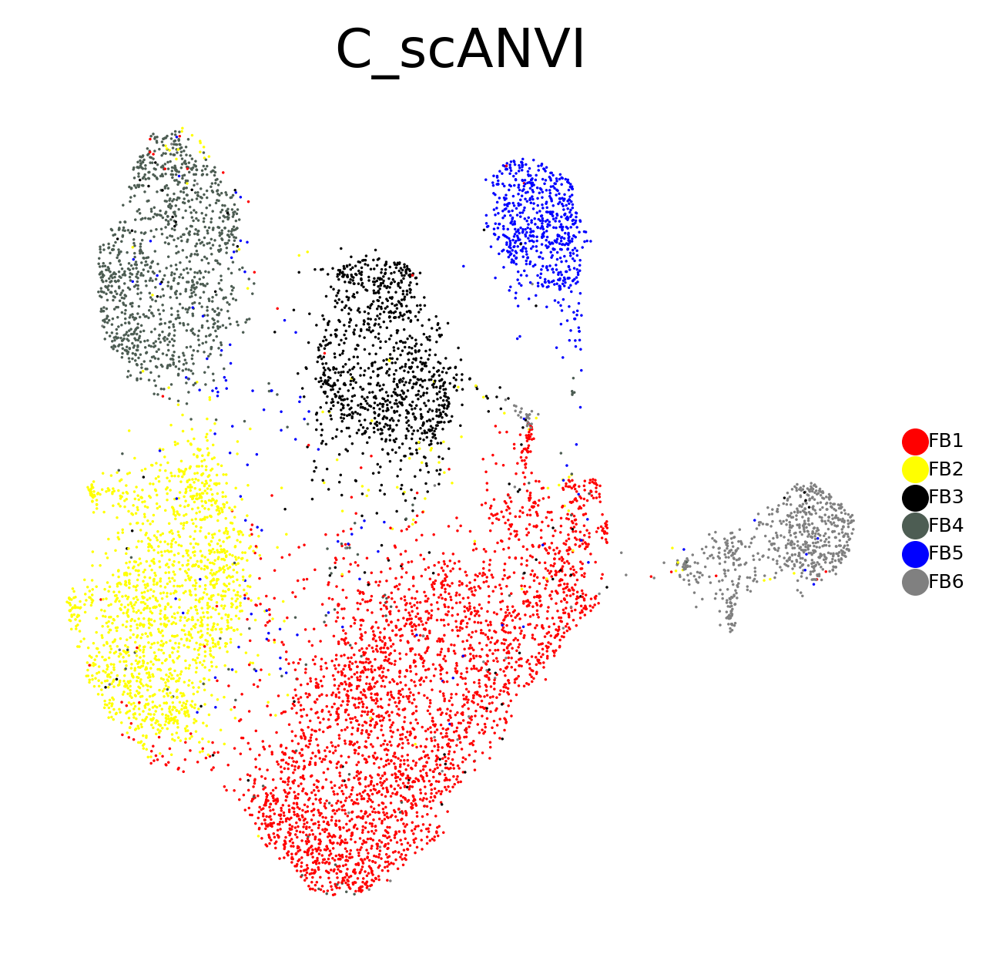

In [44]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI'], size = 2.0, legend_fontsize = 5, ncols = 4, palette = bauhaus_colors)

In [45]:
df = adata_toplot.obs.groupby(['genotype', 'C_scANVI']).size().reset_index(name = 'counts')

grouped = df.groupby('genotype')['counts'].apply(lambda x: x / x.sum() * 100)
grouped = grouped.reset_index()

df['proportions'] = grouped['counts']
df['waffle_counts'] = (df['proportions'] * 10).astype(int)

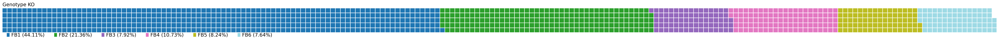

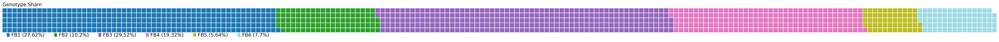

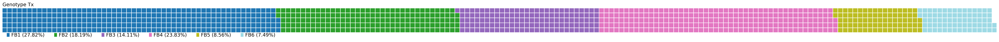

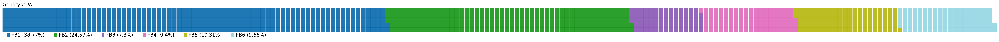

In [46]:
tab20_palette = plt.cm.get_cmap('tab20', len(df['C_scANVI'].unique()))


for group in df['genotype'].unique():
    temp_df = df[df['genotype'] == group]
    
    data = dict(zip(temp_df['C_scANVI'], temp_df['waffle_counts']))
    colors = [tab20_palette(i) for i in range(len(temp_df['C_scANVI']))]
    fig = plt.figure(
        FigureClass = Waffle, 
        rows = 5, 
        values = data, 
        title = {'label': f'Genotype {group}', 'loc': 'left', 'fontsize': 14},
        labels = [f"{k} ({v}%)" for k, v in zip(temp_df['C_scANVI'], temp_df['proportions'].round(2))],
        #legend = {'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0},
        legend = {'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0, 'fontsize': 14},
        figsize = (40, 4),
        colors = colors
    )
    plt.show()

### Export annotated sample object 

In [47]:
adata.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata.obs.index])
adata.obs.index

Index(['AAACCAACAAACGGGC-1-KDM6A_wt_11', 'AAACCAACAATTGCGC-1-KDM6A_wt_11',
       'AAACCAACATAGACTT-1-KDM6A_wt_11', 'AAACCGAAGCACTAGT-1-KDM6A_wt_11',
       'AAACCGAAGCGTGCGT-1-KDM6A_wt_11', 'AAACCGGCAAGGTCGA-1-KDM6A_wt_11',
       'AAACGCGCACCACAAC-1-KDM6A_wt_11', 'AAACGGATCAGCCAAT-1-KDM6A_wt_11',
       'AAACGGATCTAAGTCA-1-KDM6A_wt_11', 'AAACGTACAGCAACAG-1-KDM6A_wt_11',
       ...
       'TTGTGAGGTAGTTGGC-1-GSKJ4_treat_52',
       'TTGTGAGGTCATGCAA-1-GSKJ4_treat_52',
       'TTGTGCCTCTAATCTC-1-GSKJ4_treat_52',
       'TTGTTGCGTCAAGACC-1-GSKJ4_treat_52',
       'TTGTTGCGTTACAAAC-1-GSKJ4_treat_52',
       'TTTAAGGTCATGCCTC-1-GSKJ4_treat_52',
       'TTTAGCAAGGTCCGTA-1-GSKJ4_treat_52',
       'TTTCGTCCACCTGTAA-1-GSKJ4_treat_52',
       'TTTCTCACATAATGTC-1-GSKJ4_treat_52',
       'TTTGTGAAGAAAGGAA-1-GSKJ4_treat_52'],
      dtype='object', length=8768)

In [48]:
adata_raw.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata_raw.obs.index])
adata_raw.obs.index

Index(['AAACCAACAAACGGGC-1-KDM6A_wt_11', 'AAACCAACAATTGCGC-1-KDM6A_wt_11',
       'AAACCAACATAGACTT-1-KDM6A_wt_11', 'AAACCGAAGCACTAGT-1-KDM6A_wt_11',
       'AAACCGAAGCGTGCGT-1-KDM6A_wt_11', 'AAACCGGCAAGGTCGA-1-KDM6A_wt_11',
       'AAACGCGCACCACAAC-1-KDM6A_wt_11', 'AAACGGATCAGCCAAT-1-KDM6A_wt_11',
       'AAACGGATCTAAGTCA-1-KDM6A_wt_11', 'AAACGTACAGCAACAG-1-KDM6A_wt_11',
       ...
       'TTGTGAGGTAGTTGGC-1-GSKJ4_treat_52',
       'TTGTGAGGTCATGCAA-1-GSKJ4_treat_52',
       'TTGTGCCTCTAATCTC-1-GSKJ4_treat_52',
       'TTGTTGCGTCAAGACC-1-GSKJ4_treat_52',
       'TTGTTGCGTTACAAAC-1-GSKJ4_treat_52',
       'TTTAAGGTCATGCCTC-1-GSKJ4_treat_52',
       'TTTAGCAAGGTCCGTA-1-GSKJ4_treat_52',
       'TTTCGTCCACCTGTAA-1-GSKJ4_treat_52',
       'TTTCTCACATAATGTC-1-GSKJ4_treat_52',
       'TTTGTGAAGAAAGGAA-1-GSKJ4_treat_52'],
      dtype='object', length=8768)

In [49]:
adata.obs_names

Index(['AAACCAACAAACGGGC-1-KDM6A_wt_11', 'AAACCAACAATTGCGC-1-KDM6A_wt_11',
       'AAACCAACATAGACTT-1-KDM6A_wt_11', 'AAACCGAAGCACTAGT-1-KDM6A_wt_11',
       'AAACCGAAGCGTGCGT-1-KDM6A_wt_11', 'AAACCGGCAAGGTCGA-1-KDM6A_wt_11',
       'AAACGCGCACCACAAC-1-KDM6A_wt_11', 'AAACGGATCAGCCAAT-1-KDM6A_wt_11',
       'AAACGGATCTAAGTCA-1-KDM6A_wt_11', 'AAACGTACAGCAACAG-1-KDM6A_wt_11',
       ...
       'TTGTGAGGTAGTTGGC-1-GSKJ4_treat_52',
       'TTGTGAGGTCATGCAA-1-GSKJ4_treat_52',
       'TTGTGCCTCTAATCTC-1-GSKJ4_treat_52',
       'TTGTTGCGTCAAGACC-1-GSKJ4_treat_52',
       'TTGTTGCGTTACAAAC-1-GSKJ4_treat_52',
       'TTTAAGGTCATGCCTC-1-GSKJ4_treat_52',
       'TTTAGCAAGGTCCGTA-1-GSKJ4_treat_52',
       'TTTCGTCCACCTGTAA-1-GSKJ4_treat_52',
       'TTTCTCACATAATGTC-1-GSKJ4_treat_52',
       'TTTGTGAAGAAAGGAA-1-GSKJ4_treat_52'],
      dtype='object', length=8768)

In [50]:
adata.obs['C_scANVI'].cat.categories

Index(['FB1', 'FB2', 'FB3', 'FB4', 'FB5', 'FB6'], dtype='object')

In [51]:
adata.obs['C_scANVI'].value_counts()

C_scANVI
FB1    3249
FB2    1723
FB4    1197
FB3    1139
FB5     735
FB6     725
Name: count, dtype: int64

### Export annotated object with raw counts

In [52]:
adata

AnnData object with n_obs × n_vars = 8768 × 7000
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'batch_colors', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'sample_colors', 'genotype_colors', 'C_scANVI_colors', 'seed_labels_colors', 'pca'
    obsm: '_scvi_extra_categorical_covs', 'X_scVI', 'X_scANVI', 'X_u

In [53]:
adata_raw

AnnData object with n_obs × n_vars = 8768 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch_colors'

In [54]:
adata_export = anndata.AnnData(X = adata_raw.X, obs = adata.obs, var = adata_raw.var)
adata_export.obsm['X_scVI'] = adata.obsm['X_scVI'].copy()
adata_export.obsm['X_umap'] = adata.obsm['X_umap'].copy()
adata_export.obsm['X_scANVI'] = adata.obsm['X_scANVI'].copy()
adata_export

AnnData object with n_obs × n_vars = 8768 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_scVI', 'X_umap', 'X_scANVI'

In [55]:
adata_export.write('../../../data/Kdm6aKO_ALL_GEX_FB_states_ctl240311.raw.h5ad')